# An End to End Multi Class Dog Breed Classificaion
Thisa notebook builts an end to end multi class image classifier of dog's breedusing tensorflow and its hub
##1. Problem
Identify the breed of the dog given an image of the dog.

##2. Data
The data we're using is from Kaggle's dog breed indentification competition
https://www.kaggle.com/c/dog-breed-identification/data

##3. Evaluation
The evaluation is a file with prediction possibilities
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

##4. Features
Some information about the data:

* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

TF version: 2.15.0
TF Hub version: 0.16.1


In [ ]:

# Check for GPU availability
print("GPU", "available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU not available :(


In [ ]:
import pandas as pd
label_csv=pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")

print(label_csv.head())
print(label_csv.describe())

                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever
                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [ ]:
pd.DataFrame(label_csv)

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


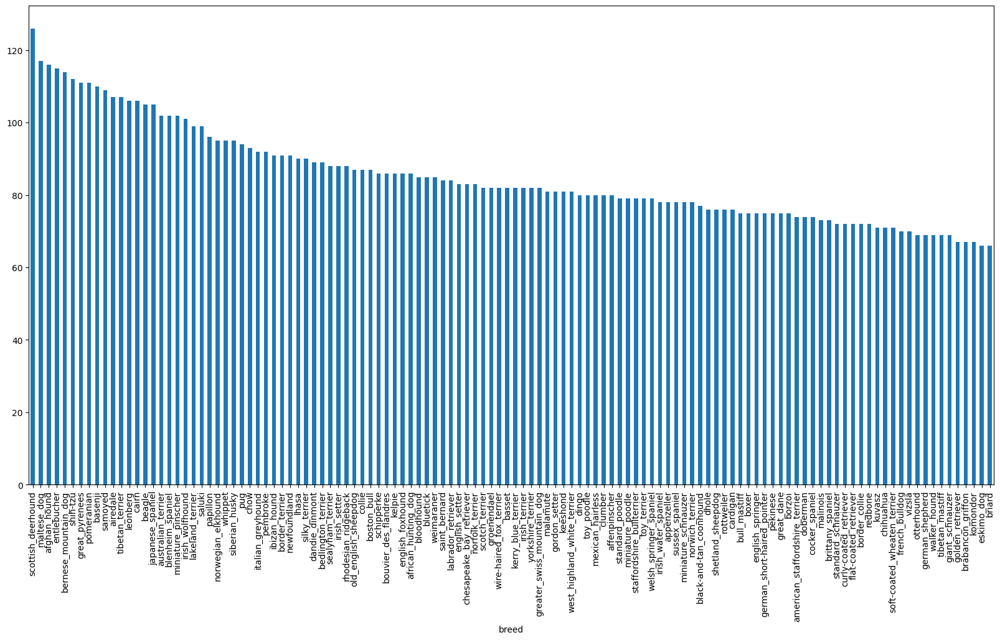

In [ ]:
label_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [ ]:

# Create pathnames from image ID's
filenames = ["drive/My Drive/Dog Vision/train/" + fname + ".jpg" for fname in label_csv["id"]]

# Check the first 10
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# It just represents the mnumber of maximum freq of that one breed
label_csv["breed"].value_counts().max()

126

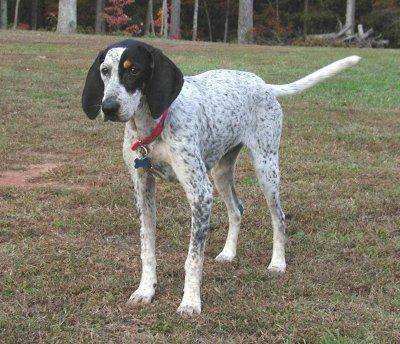

In [ ]:
# Let's view an image
import numpy as np
from IPython.display import Image
image1=Image(filenames[3])
image1


In [ ]:
import numpy as np
label=np.array(label_csv["breed"])
label[0]
unique=np.unique(label)
len(unique)
label[0]==unique



array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
label[10221]==unique

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
label
len(label)

10222

In [ ]:
unique
len(unique)

120

In [ ]:
unique[19]

'boston_bull'

In [ ]:
len(filenames)

10222

In [ ]:

# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/My Drive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do no match actual amount of files, check the target directory.")


Filenames match actual amount of files!!! Proceed.


In [ ]:
label_csv["breed"][9000]


'tibetan_mastiff'

In [ ]:

labels=label
labels[:10]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [ ]:
unique[:5]

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier'], dtype=object)

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique for label in labels]
boolean_labels[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique== labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))


pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
X=filenames
Y=boolean_labels

In [ ]:
len(filenames) , len(boolean_labels)

(10222, 10222)

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, Y_train, Y_val = train_test_split(X[:NUM_IMAGES],
                                                  Y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(Y_train), len(X_val), len(Y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:5], Y_train[:2]


(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[49])
image.shape


(333, 500, 3)

In [ ]:
#Convert image into Tensors
tf.constant(image[:2])

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[143, 155,  43],
        [171, 184,  76],
        [173, 188,  87],
        ...,
        [110, 141,  63],
        [ 96, 127,  49],
        [ 90, 121,  43]],

       [[128, 140,  28],
        [165, 179,  68],
        [168, 183,  80],
        ...,
        [ 94, 126,  43],
        [ 90, 122,  39],
        [ 89, 121,  38]]], dtype=uint8)>

In [ ]:
 #tensor is defined by the number of directions (and hence the dimensionality of the array) required to describe it.
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [ ]:
process_image(filenames[0],IMG_SIZE)

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.5705322 , 0.33588538, 0.15008473],
        [0.66901225, 0.46011657, 0.26022965],
        [0.61062384, 0.43763596, 0.21601713],
        ...,
        [0.8182312 , 0.7297958 , 0.26963907],
        [0.72454786, 0.6059109 , 0.2653059 ],
        [0.7494603 , 0.6252918 , 0.32456532]],

       [[0.6761415 , 0.4733761 , 0.3064293 ],
        [0.5672121 , 0.38192675, 0.20349538],
        [0.5883547 , 0.4322571 , 0.2403155 ],
        ...,
        [0.9326942 , 0.8260503 , 0.41093278],
        [0.86072475, 0.74250627, 0.3694122 ],
        [0.76781666, 0.6461604 , 0.29291284]],

       [[0.46350825, 0.29595745, 0.1536156 ],
        [0.42554107, 0.27039403, 0.12009467],
        [0.7887875 , 0.6547362 , 0.49015   ],
        ...,
        [0.89372385, 0.76964   , 0.41811958],
        [0.88609535, 0.7585918 , 0.36495727],
        [0.8243601 , 0.69494826, 0.2930575 ]],

       ...,

       [[0.7344025 , 0.4716574 , 0.2559711 ],
        [0.71

Turning our data into batches
Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: (image, label).

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and reutrns a typle of (image, label).
  """
  image = process_image(image_path)
  return image, label


In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(Y[42]))


(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:

# Create training and validation data batches
train_data = create_data_batches(X_train, Y_train)
val_data = create_data_batches(X_val, Y_val, valid_data=True )

Creating training data batches...
Creating validation data batches...


## Visualizing data batches!!!

In [ ]:
import matplotlib.pyplot as plt
def show_25_images(images,labels):
    """
  Displays a plot of 25 images and their labels from a data batch.
  """
    plt.figure(figsize=(10,10))
    for i in range(25):
     ax=plt.subplot(5,5,i+1)
     plt.imshow(images[i])
    plt.title(unique[labels[i].argmax()])
     # Turn the grid lines off
    #plt.axis("off")


In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())

In [ ]:
len(train_images),len(train_labels)

(32, 32)

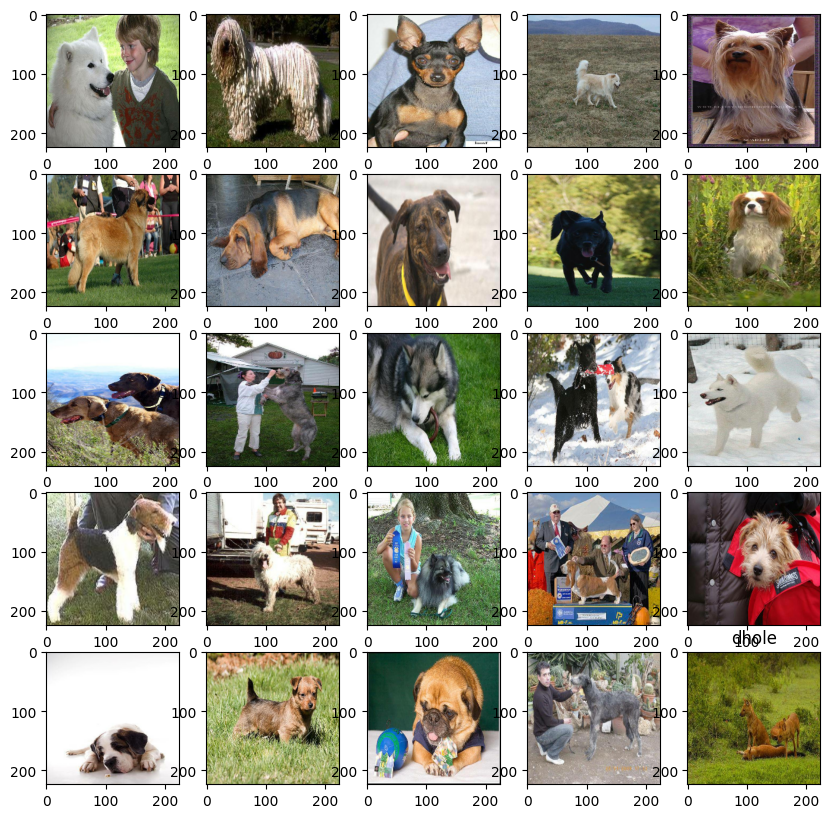

In [ ]:
show_25_images(train_images,train_labels)


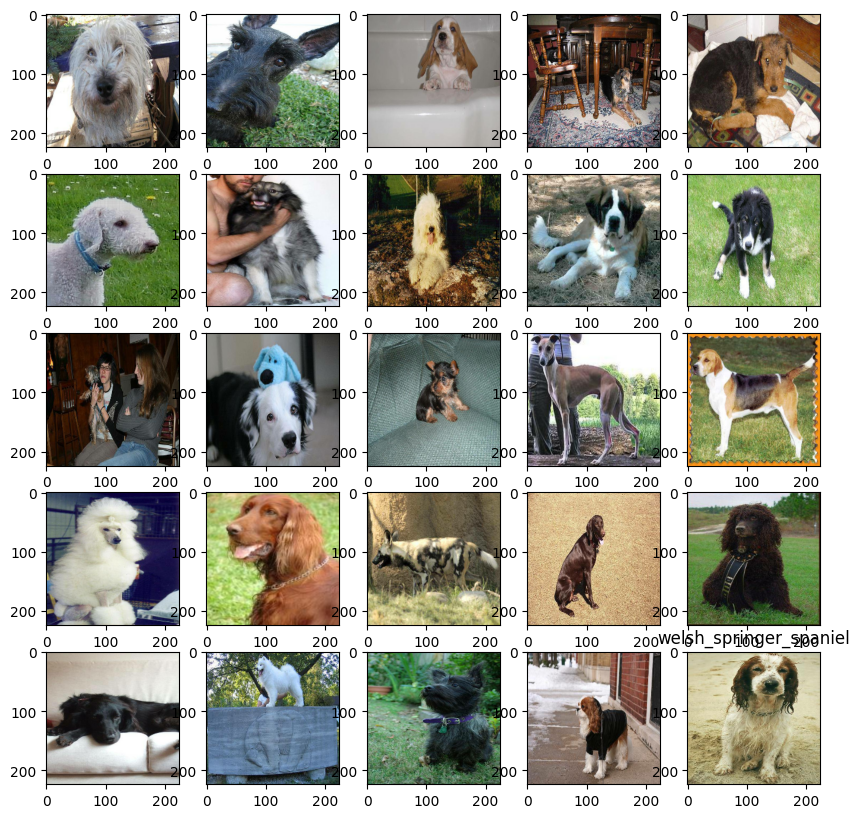

In [ ]:
#let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [ ]:
len(val_images),len(val_labels)


(32, 32)

## Building a model
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub- https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
IMG_SIZE


224

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard


In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Data/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
 #Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

In [ ]:
# Check again if GPU is available (otherwise computing will take a looooonnnnggggg time)
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESS!!!!)


In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])

  return model


In [ ]:
train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 230s 9s/step - loss: 4.4858 - accuracy: 0.1088 - val_loss: 3.4517 - val_accuracy: 0.2600
Epoch 2/100
25/25 [==============================] - 5s 195ms/step - loss: 1.5613 - accuracy: 0.6988 - val_loss: 2.1913 - val_accuracy: 0.4600
Epoch 3/100
25/25 [==============================] - 7s 297ms/step - loss: 0.5455 - accuracy: 0.9463 - val_loss: 1.6782 - val_accuracy: 0.5600
Epoch 4/100
25/25 [==============================] - 5s 194ms/step - loss: 0.2432 - accuracy: 0.9887 - val_loss: 1.4886 - val_accuracy: 0.5900
Epoch 5/100
25/25 [==============================] - 5s 180ms/step - loss: 0.1416 - accuracy: 0.9987 - val_loss: 1.4141 - val_accuracy: 0.6050
Epoch 6/100
25/25 [==============================] - 5s 187ms/step - loss: 0.0980 - accuracy: 1.0000 - val_loss: 1.3747 - val_accuracy: 0.6000
Epoch 7/100
25/25 [==============================]

In [ ]:
%tensorboard --logdir drive/My\ Drive/Data/logs


<IPython.core.display.Javascript object>

In [ ]:
model=train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 10s 218ms/step - loss: 4.5207 - accuracy: 0.0962 - val_loss: 3.3735 - val_accuracy: 0.2150
Epoch 2/100
25/25 [==============================] - 4s 173ms/step - loss: 1.5910 - accuracy: 0.7138 - val_loss: 2.1208 - val_accuracy: 0.5250
Epoch 3/100
25/25 [==============================] - 5s 199ms/step - loss: 0.5423 - accuracy: 0.9525 - val_loss: 1.6433 - val_accuracy: 0.6250
Epoch 4/100
25/25 [==============================] - 5s 195ms/step - loss: 0.2467 - accuracy: 0.9912 - val_loss: 1.4785 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 4s 147ms/step - loss: 0.1426 - accuracy: 0.9962 - val_loss: 1.4029 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 5s 195ms/step - loss: 0.0995 - accuracy: 0.9987 - val_loss: 1.3643 - val_accuracy: 0.6750
Epoch 7/100
25/25 [=============================

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions.shape

7/7 [==============================] - 2s 119ms/step


(200, 120)

In [ ]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique[np.argmax(predictions[0])]}") # the predicted label

[9.49223293e-04 6.41081715e-05 6.77552016e-04 1.37839568e-04
 4.02627338e-04 4.95296517e-05 9.66725573e-02 1.29525177e-03
 2.87018367e-04 3.72316485e-04 1.07910112e-03 4.03153535e-05
 1.33445312e-04 1.99569185e-05 2.51296024e-05 3.51688243e-03
 2.90743610e-05 3.50009114e-01 2.64274040e-05 1.85344616e-05
 6.92263653e-04 7.88134275e-05 1.46924503e-05 7.03074329e-04
 1.29407681e-05 1.87612139e-04 1.52515382e-01 3.40795759e-06
 1.15068175e-03 3.79780220e-04 9.06031128e-05 3.81578342e-04
 3.08539078e-04 1.29284512e-04 3.14012505e-05 2.20138207e-02
 6.61500917e-06 8.73866447e-05 2.72919515e-05 1.27749727e-05
 6.39329490e-04 1.60814270e-05 5.91671160e-05 1.87518133e-04
 5.57102067e-05 4.10003267e-04 5.59923428e-05 7.20383468e-05
 1.69841078e-04 2.73310492e-04 3.44395412e-05 1.27031126e-05
 5.24196112e-05 1.56346505e-05 1.57181621e-05 3.30101939e-05
 3.94217277e-05 7.76980887e-04 1.38980031e-04 7.58034959e-02
 3.49451089e-04 5.55445258e-05 7.23387231e-04 1.09299326e-05
 5.78740583e-05 2.254911

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'border_terrier'

In [ ]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

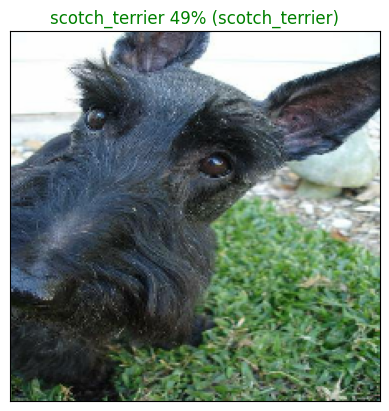

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

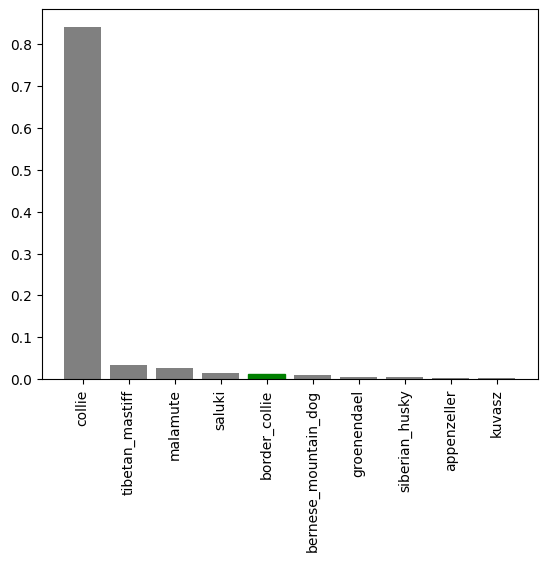

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

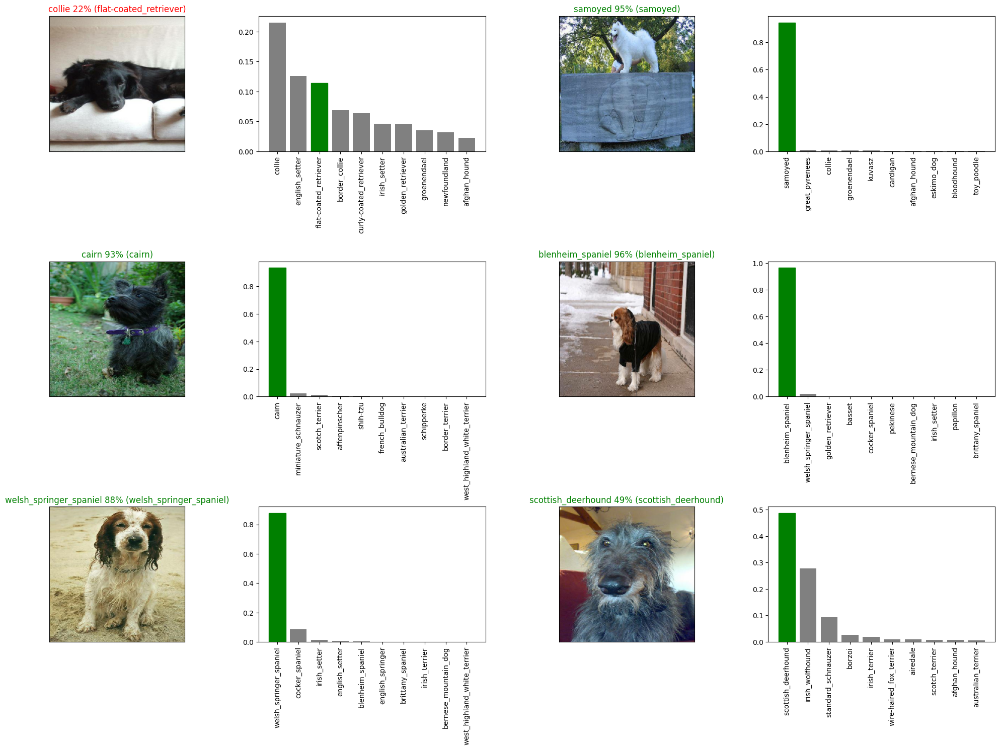

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

# Saving and reloading a trained model

In [ ]:

# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20240510-19131715368392-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog Vision/models/20240510-19131715368392-1000-images-mobilenetv2-Adam.h5'

In [ ]:
loaded_1000_image_model=load_model("drive/My Drive/Dog Vision/models/20240510-19131715368392-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/My Drive/Dog Vision/models/20240510-19131715368392-1000-images-mobilenetv2-Adam.h5


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 1s 164ms/step - loss: 1.2235 - accuracy: 0.7050


[1.2235445976257324, 0.7049999833106995]

In [ ]:
len(X),len(Y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, Y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 51s 138ms/step - loss: 1.3438 - accuracy: 0.6696
Epoch 2/100
320/320 [==============================] - 49s 152ms/step - loss: 0.3983 - accuracy: 0.8853
Epoch 3/100
320/320 [==============================] - 45s 142ms/step - loss: 0.2366 - accuracy: 0.9358
Epoch 4/100
320/320 [==============================] - 47s 148ms/step - loss: 0.1510 - accuracy: 0.9652
Epoch 5/100
320/320 [==============================] - 48s 150ms/step - loss: 0.1052 - accuracy: 0.9784
Epoch 6/100
320/320 [==============================] - 45s 140ms/step - loss: 0.0771 - accuracy: 0.9880
Epoch 7/100
320/320 [==============================] - 44s 137ms/step - loss: 0.0577 - accuracy: 0.9925
Epoch 8/100
320/320 [==============================] - 45s 139ms/step - loss: 0.0458 - accuracy: 0.9951
Epoch 9/100
320/320 [==============================] - 46s 144ms/step - loss: 0.0376 - accuracy: 0.9956
Epoch 10/100
320/320 [==============================] - 49s 153m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")


Saving model to: drive/My Drive/Dog Vision/models/20240510-19491715370597-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog Vision/models/20240510-19491715370597-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model=load_model("drive/My Drive/Dog Vision/models/20240510-19491715370597-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/My Drive/Dog Vision/models/20240510-19491715370597-full-image-set-mobilenetv2-Adam.h5


# For Test-Data

In [ ]:
# Load test image filenames
test_path = "drive/My Drive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog Vision/test/e702ddff98bd0b05ab200ffb43fb080a.jpg',
 'drive/My Drive/Dog Vision/test/e0165801e47527205e45295aba441972.jpg',
 'drive/My Drive/Dog Vision/test/e6b1859592468c8ffc1a73f87b201ba7.jpg',
 'drive/My Drive/Dog Vision/test/dd51cac7c6e1e091b26545aec86dabf3.jpg',
 'drive/My Drive/Dog Vision/test/de327414ced20d4e6f786a68bff82e10.jpg',
 'drive/My Drive/Dog Vision/test/e4c743b9aaf615dd5fe162bf25f82fb5.jpg',
 'drive/My Drive/Dog Vision/test/e6353a9420e1e529b6c20b9414786ae7.jpg',
 'drive/My Drive/Dog Vision/test/e021107c3f07749e5f5b389e57e21ded.jpg',
 'drive/My Drive/Dog Vision/test/dd703c7beeaf5cba5533d5f42b608f2e.jpg',
 'drive/My Drive/Dog Vision/test/e411a1b3681604f6321af7cb8e8f2de7.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data=create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 2272s 7s/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.05523381e-04, 1.62171636e-06, 4.70119858e-07, ...,
        7.66002428e-10, 1.46998309e-06, 7.84181248e-06],
       [3.98641227e-08, 1.22074564e-08, 2.96414404e-09, ...,
        2.63367856e-05, 2.28971259e-10, 1.47751877e-09],
       [3.96149069e-09, 1.93152072e-08, 6.54620746e-10, ...,
        2.00989323e-08, 2.86630727e-03, 2.45099864e-06],
       ...,
       [2.98317593e-09, 1.89906160e-07, 3.39926773e-05, ...,
        7.46353979e-10, 4.65750009e-06, 7.60283725e-10],
       [5.26798649e-09, 9.57293878e-07, 3.79154530e-09, ...,
        9.45657508e-09, 7.55841830e-12, 3.18776727e-10],
       [8.19250778e-11, 1.21141638e-10, 8.44729730e-05, ...,
        5.49675860e-06, 4.49564075e-09, 3.25217940e-07]])

In [ ]:
# Get custom image filepaths
custom_path = "drive/My Drive/Dog Vision/realimages/"
custom_image_path=[custom_path + fname for fname in os.listdir(custom_path)]
if not custom_image_path:
    raise ValueError("No files found in the directory:", custom_path)
custom_image_path


['drive/My Drive/Dog Vision/realimages/bulldog.jpeg',
 'drive/My Drive/Dog Vision/realimages/6e85a0f7855085f78149428327b4ec93.jpg']

In [ ]:
custom_data = create_data_batches(custom_image_path, test_data=True)


Creating test data batches...


In [ ]:
custom_preds = loaded_full_model.predict(custom_data)
custom_preds

1/1 [==============================] - 1s 823ms/step


array([[3.86816691e-06, 1.25406852e-10, 1.29941236e-09, 1.07568832e-09,
        3.60248850e-05, 9.77842962e-09, 1.17657102e-07, 3.64264565e-07,
        8.20016737e-07, 4.23901536e-09, 2.11648796e-10, 3.90065841e-10,
        7.36691632e-08, 4.67825734e-09, 1.25013102e-07, 4.23902380e-09,
        6.10555606e-09, 5.99049486e-08, 2.37715875e-10, 2.74511222e-05,
        5.36460765e-10, 5.06219338e-04, 2.68731765e-05, 1.19963414e-10,
        8.25626068e-10, 1.22331157e-02, 1.49508031e-10, 3.95537612e-08,
        2.49518131e-08, 2.48948484e-09, 1.44695323e-05, 2.59951557e-05,
        1.30542226e-08, 1.18910897e-07, 5.63482816e-09, 3.76799051e-07,
        1.14936616e-09, 1.58952869e-08, 3.31499050e-09, 1.52085022e-07,
        2.13133999e-09, 4.03170053e-10, 1.57658739e-08, 1.17552273e-10,
        3.46813671e-08, 9.84866142e-01, 3.27227889e-09, 1.60067803e-09,
        2.79130474e-09, 1.79947181e-12, 1.47959200e-09, 1.70274983e-09,
        1.41052581e-09, 5.76920002e-06, 2.48259191e-08, 7.708347

In [ ]:
(test_predictions[10000]).argmax().

110

In [ ]:
custom_preds.shape

(2, 120)

In [ ]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['french_bulldog', 'chow']

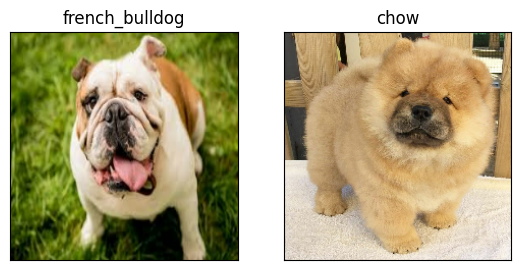

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)
